# Détection de places de parking

*Auteur : Yassine Ben Yaghlane*

## Imports

In [1]:
import tensorflow as tf
print(tf.__version__)
print(tf.test.is_gpu_available())

1.15.0
True


In [2]:
import os
from pathlib import Path

for file in os.listdir():
    print(file)



.ipynb_checkpoints
mask_rcnn_coco.h5
mrcnn
Parking_spot_detection.ipynb
requirements.txt
videosInput
videosOutput


In [3]:
video_dir = "videosInput/"
for file in os.listdir(video_dir):
    print(file)

free1.MP4
free2.MP4
free3.MP4
jour_1.MP4
neige_1.MP4
neige_2.MP4
nuit.MP4


In [5]:
#imports
import time
import datetime
import math
import numpy as np
import matplotlib.patches as patches
import matplotlib.pyplot as plt
import cv2
import mrcnn.config
import mrcnn.utils
from mrcnn.model import MaskRCNN
from mrcnn import visualize
from skimage.io import imsave, imread
from skimage.color import rgb2gray
import scipy.integrate as integrate

Using TensorFlow backend.


In [6]:
def apply_mask_rgb(im, mask, color=[0, 0, 0], alpha = 0.5):
    out = im.copy()
    out[:,:,0][mask] = out[:,:,0][mask] * alpha + color[0] * (1-alpha)
    out[:,:,1][mask] = out[:,:,1][mask] * alpha + color[1] * (1-alpha)
    out[:,:,2][mask] = out[:,:,2][mask] * alpha + color[2] * (1-alpha)
    return out

## Load Model

In [7]:
#MaskRCNN Config
class MaskRCNNConfig(mrcnn.config.Config):
    NAME="coco_pretrained_model_config"
    IMAGES_PER_GPU = 1
    GPU_COUNT = 1
    NUM_CLASSES = 80 + 1
    DETECTION_MIN_CONFIDENCE = 0.9

In [8]:
# define 81 classes that the coco model knowns about
class_names = ['BG', 'person', 'bicycle', 'car', 'motorcycle', 'airplane',
               'bus', 'train', 'truck', 'boat', 'traffic light',
               'fire hydrant', 'stop sign', 'parking meter', 'bench', 'bird',
               'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear',
               'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie',
               'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball',
               'kite', 'baseball bat', 'baseball glove', 'skateboard',
               'surfboard', 'tennis racket', 'bottle', 'wine glass', 'cup',
               'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple',
               'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza',
               'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed',
               'dining table', 'toilet', 'tv', 'laptop', 'mouse', 'remote',
               'keyboard', 'cell phone', 'microwave', 'oven', 'toaster',
               'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors',
               'teddy bear', 'hair drier', 'toothbrush']

In [9]:
ROOT_DIR = Path(".")
MODEL_DIR = os.path.join(ROOT_DIR, "logs")
coco_model_path = os.path.join(ROOT_DIR, "mask_rcnn_coco.h5")

model = MaskRCNN(mode="inference", model_dir=MODEL_DIR, config = MaskRCNNConfig())
model.load_weights(coco_model_path, by_name=True)


Instructions for updating:
If using Keras pass *_constraint arguments to layers.


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Instructions for updating:
box_ind is deprecated, use box_indices instead


Instructions for updating:
Use `tf.cast` instead.


In [10]:
!nvidia-smi

Tue Jun  8 18:04:02 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 462.30       Driver Version: 462.30       CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name            TCC/WDDM | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  GeForce RTX 2080   WDDM  | 00000000:01:00.0  On |                  N/A |
| 32%   47C    P2    43W / 215W |   7859MiB /  8192MiB |      3%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

## Load video

In [11]:
Video_source = video_dir + "free1.MP4"
video_capture = cv2.VideoCapture(Video_source)
fps = video_capture.get(cv2.CAP_PROP_FPS)

totalNoFrames = video_capture.get(cv2.CAP_PROP_FRAME_COUNT);
durationInSeconds = float(totalNoFrames) / float(fps)

print("fps : ", fps)
print("nbFrames : ", totalNoFrames)
print("durationInSeconds: ",durationInSeconds,"s")

fps :  29.73240832507433
nbFrames :  1001.0
durationInSeconds:  33.66696666666667 s


The following function reads a video and saves its frames at the specified interval.

In [12]:
def load_video_frames(video_path, frames_interval=30):
    frames = []
    Video_source = video_path
    video_capture = cv2.VideoCapture(Video_source)
    fps = video_capture.get(cv2.CAP_PROP_FPS)
    totalNoFrames = video_capture.get(cv2.CAP_PROP_FRAME_COUNT);
    durationInSeconds = float(totalNoFrames) / float(fps)

    print("fps : ", fps)
    print("nbFrames : ", totalNoFrames)
    print("durationInSeconds: ",durationInSeconds,"s")

    counter = 0

    while video_capture.isOpened():
        success, frame = video_capture.read()

        if counter >= totalNoFrames:
            video_capture.release()
            print("Success ! Video closed.")
            break

        elif not success :
            print("couldn't read frame")
            video_capture.release()
            print("Fail ! Video closed.")
            break

        elif counter%frames_interval == 0 :
            im_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            frames.append(im_rgb)

        counter += 1
  
    return frames


In [13]:
frames = load_video_frames(Video_source)

fps :  29.73240832507433
nbFrames :  1001.0
durationInSeconds:  33.66696666666667 s
Success ! Video closed.


Show some saved frames from the video

total number of frames :  34


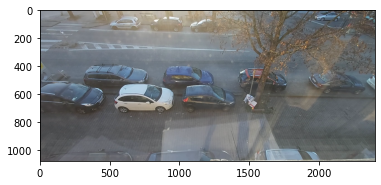

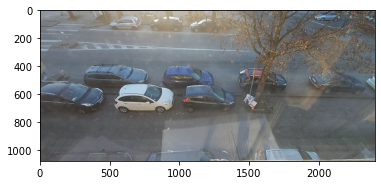

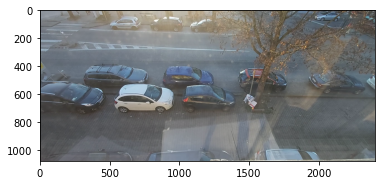

In [14]:
print("total number of frames : ", len(frames))
for frame in frames[:3]:
    plt.figure()
    plt.imshow(frame)
    plt.show()

## Processing frames with Mask-RCNN

The following cell takes time. Do not run it without gpu.

In [16]:
results = []
for frame in frames:
    results.append(model.detect([frame], verbose=0)[0])

Show some results of the processing

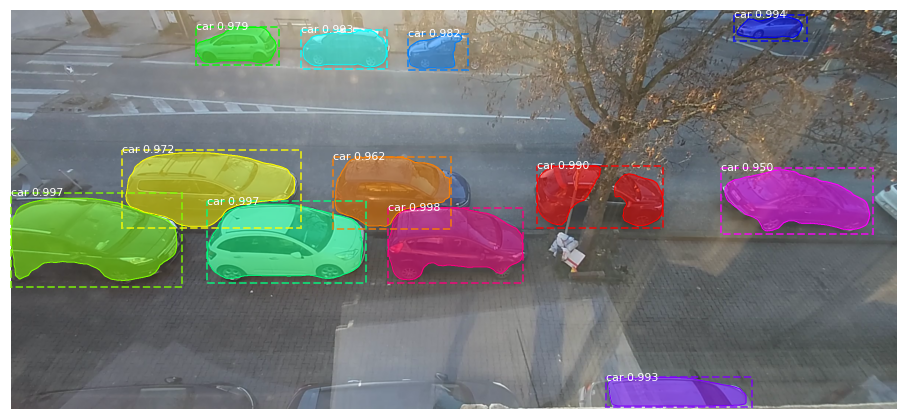

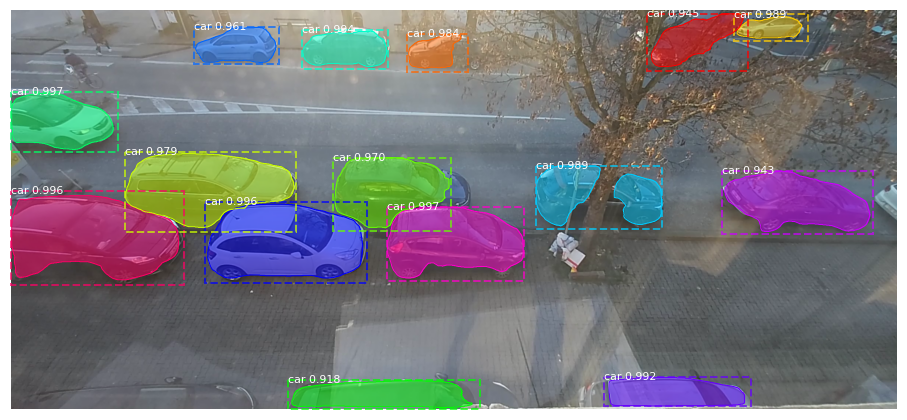

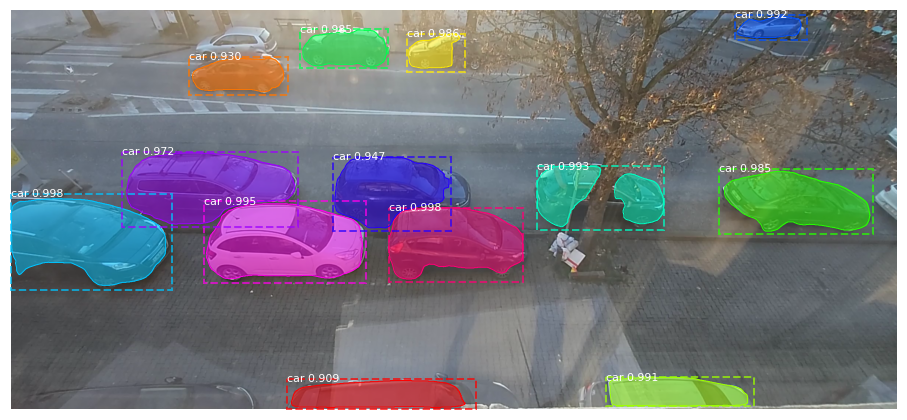

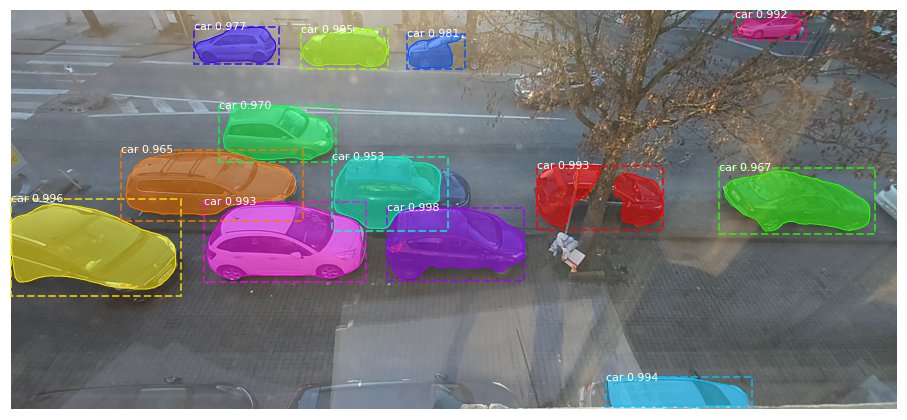

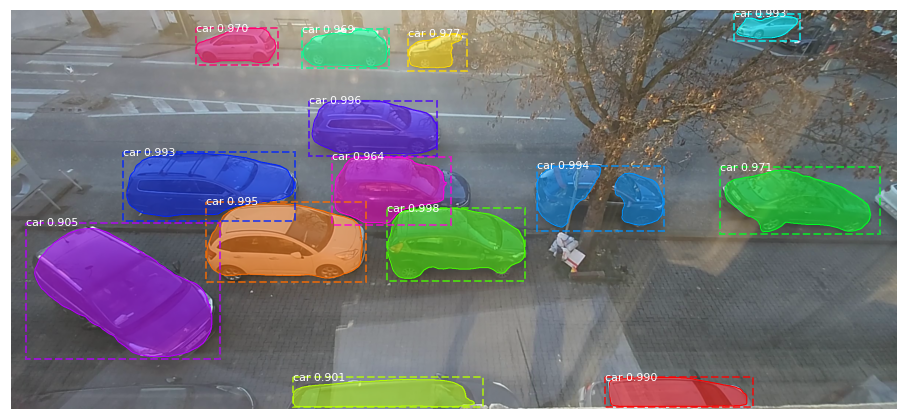

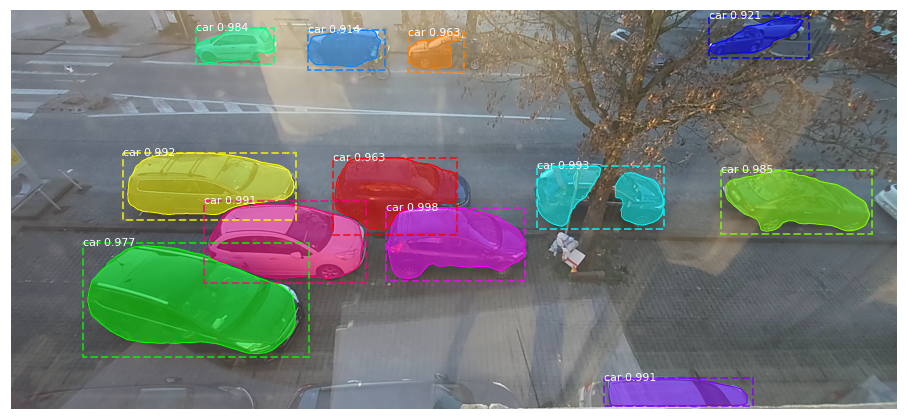

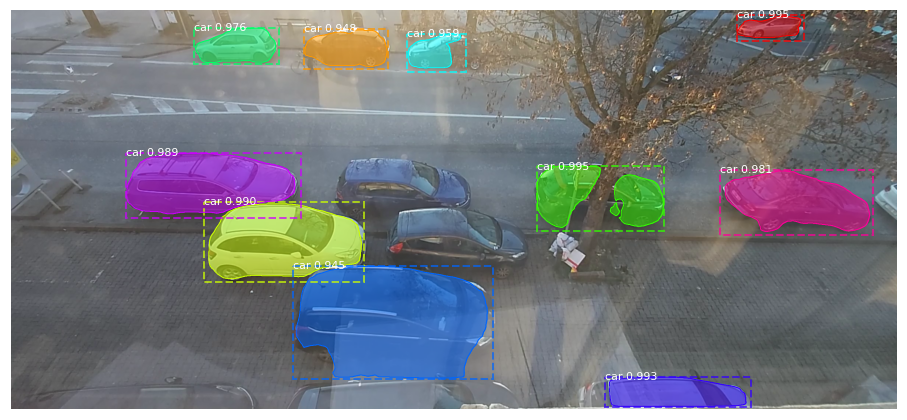

In [17]:
for i in range(0, len(results), 5):
    r = results[i]
    visualize.display_instances(frames[i], r['rois'], r['masks'], r['class_ids'], class_names, r['scores'], show_bbox=True)

## Filtering step

In this step we can only select the vehicles which correspond to class id 3,6 or 8.

In [18]:
def filter_results(results):
    r = results.copy()
    deleted = 0
    for i, val in enumerate(results["class_ids"]):
        if val not in [3,6,8]:
            r["class_ids"] = np.delete(r["class_ids"], i - deleted, axis=0)
            r["rois"] = np.delete(r["rois"], i - deleted, axis=0)
            r["scores"] = np.delete(r["scores"], i - deleted, axis=0)
            r["masks"] = np.delete(r["masks"], i - deleted, axis=2)
            deleted += 1
    return r

In [19]:
for i in range(len(results)):
    results[i] = filter_results(results[i])

### Definition of the Regions Of Interest (ROI's)

The class Area corresponds to the data related to a single roi. A region is viewed as a quadrilateral. We can therefore only save the points of the quadrilateral in a list (area_points). 

In [20]:
class Area:
    def __init__(self, area_points, color, line_color=(255, 243, 23)):
        self.area_points = np.int32([np.array(area_points)])
        self.median_points = self.setMedianPoints()
        self.color = color
        self.line_color = line_color
        return None

    def setMedianPoints(self):
        if self.area_points.shape[1] == 4:
            return [tuple(np.int32((self.area_points[0, 0] + self.area_points[0, 1])/2)), tuple(np.int32((self.area_points[0, 2] + self.area_points[0, 3])/2))]
        return None

The class FrameConfig saves the rois and draw them when needed.  

In [21]:
class FrameConfig:
    def __init__(self, frame):
        self.frame = frame.copy()
        self.areas = []
        self.masks = []
        self.lines = []
        return None

    def addArea(self, area):
        self.areas.append(area)
        area_mask = self.getAreaMask(area)
        self.masks.append(area_mask)
        area_line = self.getAreaLine(area)
        self.lines.append(area_line)
        return None

    def getAreaMask(self, area):
        black_frame = np.zeros_like(self.frame)
        black_frame = cv2.fillPoly(black_frame, area.area_points, area.color)
        area_mask = ((black_frame == area.color).all(-1)).astype("uint8")
        area_mask = cv2.erode( area_mask, np.ones((5, 5), np.uint8), iterations=1)
        return area_mask
  
    def getAreaLine(self, area):
        black_frame = np.zeros_like(self.frame)
        if area.median_points == None:
            raise ValueError("Area without median points")

        black_frame = cv2.line(black_frame, area.median_points[0], area.median_points[1], area.line_color)
        area_line = np.where(np.all(black_frame == area.line_color, axis=-1))
        area_line = np.array(list(zip(area_line[0], area_line[1])), dtype=[('x', int), ('y', int)])
        area_line.sort(order='y')

        return area_line

    def drawAreaContour(self, area):
        self.frame = cv2.polylines(self.frame, area.area_points, True, area.color)
        return self.frame

    def drawArea(self, area):
        #print("points gotten : ", area.area_points)
        self.frame = cv2.fillPoly(self.frame, area.area_points, area.color)
        return self.frame

    def drawAreaLine(self, area):
        if area.median_points != None:
            self.frame = cv2.line(self.frame, area.median_points[0], area.median_points[1], area.line_color)
        return self.frame

    def drawAllAreas(self):
        for area in self.areas:
            self.frame = self.drawAreaContour(area)
            self.frame = self.drawArea(area)
            self.frame = self.drawAreaLine(area)
        return self.frame

In [22]:
frameConfig = FrameConfig(frames[0])

Create manually the rois by setting the 4 points of each roi.

**Note : These points depends on the videos. The file "rois_config.txt" contains the points of
         the regions of interest of the videos in "videosInput".**

In [23]:
# Polygon points in anti clockwise , coordinates in (x, y) format

points1 = [
            [497,60],
            [476,142],
            [1409, 177],
            [1409, 100]
          ]
area1 = Area(points1, (0, 0, 255))

points2 = [
            [235,440],
            [157,550],
            [2400, 600],
            [2400, 480]
          ]
area2 = Area(points2, (255, 0, 0))

points3 = [
            [0,550],
            [0,723],
            [1453, 733],
            [1453, 613]
          ]
area3 = Area(points3, (0, 255, 0))
 

points4 = [
            [1670,615],
            [1710,750],
            [2400, 760],
            [2400, 630]
          ]
area4 = Area(points4, (255, 255, 0))

frame shape :  (1080, 2400, 3)


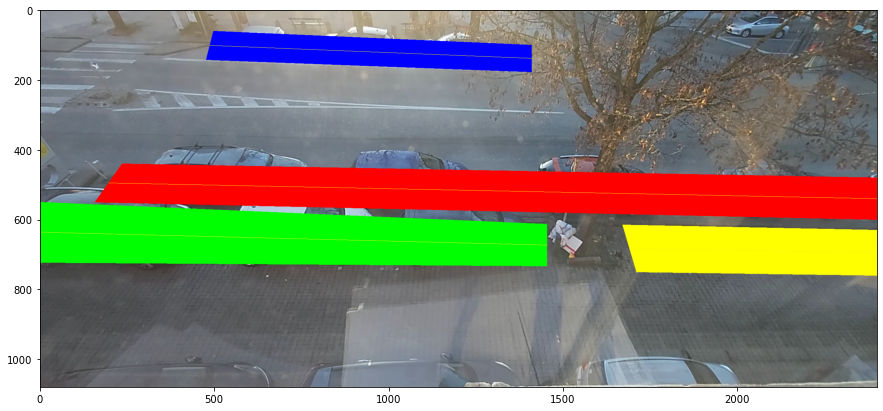

In [24]:
frameConfig.addArea(area1)
frameConfig.addArea(area2)
frameConfig.addArea(area3)
frameConfig.addArea(area4)

min_amount_accepted_by_area = [100 , 100 , 100 , 100 ] # These values still has to be configured.

print("frame shape : ", frame.shape)

%matplotlib inline
plt.figure(figsize = (15, 15))
plt.imshow(frameConfig.drawAllAreas())
plt.show()

## Associate car to area

In [25]:
nb_cars = results[0]["masks"].shape[2]
cars_area = [-1 for i in range(nb_cars)]
for i in range(nb_cars):
    max_index, max_amount = -1, 0
    for j in range(len(frameConfig.masks)):
        current = (frameConfig.masks[j] * results[0]["masks"][:,:,i]).sum()
        if current > max_amount and current > min_amount_accepted_by_area[j]:
            max_index, max_amount = j, current
            cars_area[i] = max_index

print(cars_area)

[2, 2, 2, -1, -1, 0, 1, 0, 0, 1, 1, 1]


### Verification

The first car is found in the area 2 (the green one) and the below image shows the mask of the first car which is in the second area. 

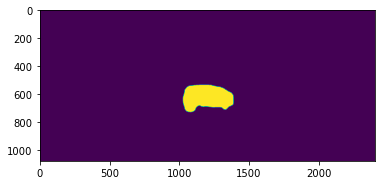

In [26]:
plt.imshow(results[0]["masks"][:,:,0])

## Free spaces detection

In [27]:
print(type(results[0]["rois"]))
print(results[0]["rois"].shape)

<class 'numpy.ndarray'>
(12, 4)


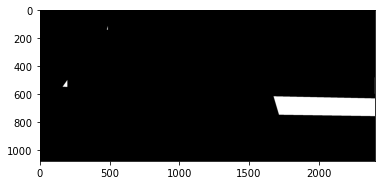

In [28]:
mask_free = np.zeros_like(frames[0].shape[:1])

for a in range(len(frameConfig.masks)): # for each area
    mask_free_area = (frameConfig.masks[a].copy() * 255).astype("uint8") # get mask of the area
    bboxs = [] # bounding boxes of the cars in this area
  
    for i in range(len(cars_area)): # fill bboxs
        if cars_area[i] == a:
            bboxs.append(results[0]["rois"][i, :])
  
    bboxs = np.array(bboxs) # convert into np array
    
    area_changing_x = [] # This array will store every "changing x coordinate"
                         # A changing x coordinate are the first and last x 
                         # coordinate of a car or a line.
    
    area_changing_x.append(frameConfig.lines[a][0][1]) # first x coordinate of the line
    
    for b in bboxs: # adding x1, x2 (first and last x coordinate) of each car in the area
        area_changing_x += [b[1], b[3]] 
        
    area_changing_x.append(frameConfig.lines[a][-1][1]) # last x coordinate of the line
    
    area_changing_x = sorted(area_changing_x) # sort the array

    # Now we can go through the line and every time a changing x is encountered we toggle the free boolean.
    free= True
    for i in range(len(area_changing_x)-1):

        if i == 0 and area_changing_x[i] != frameConfig.lines[a][0][1]:
            # This is the case where the first point of a line is in a car, we therefore need to begin with free=false
            free = False
        
        # The next if statement will set to 0 the occupied zone in the area
        # We therefore enter in this statement if free = False or if the free space is too small
        # 400 was set arbitrarily 
        if not(free) or area_changing_x[i+1] - area_changing_x[i] < 400: 
            
            # We change the mask for x = area_changing_x[i] to x = area_changing_x[i+1]
            # and set it to 0 which means this zone is not free
            mask_free_area[:, area_changing_x[i]:area_changing_x[i+1]] = 0
    
        free = not(free)

    mask_free = np.add(mask_free,(mask_free_area > 0))
    del mask_free_area

mask_free = mask_free > 0
#mask_free = cv2.erode( mask_free.astype("uint8"), np.ones((20, 20), np.uint8), iterations=1)

plt.imshow(mask_free, cmap="gray")

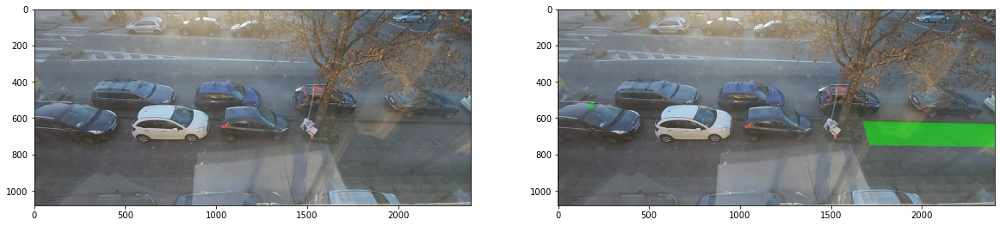

In [29]:
plt.figure(figsize=(20, 20))
plt.subplot(1, 2, 1)
plt.imshow(frames[0])
plt.subplot(1, 2, 2)
plt.imshow(apply_mask_rgb(frames[0], mask_free, color=[0,255,0]))
plt.show()

## All together

In [30]:
# Find parking spots after the maskRCNN process
def process_frame(frame, result_frame, frameConfig):
    result_frame_filtered = filter_results(result_frame) # Filtering
    
    # Associate car to area
    nb_cars = result_frame_filtered["masks"].shape[2]
    cars_area = [-1 for i in range(nb_cars)]
    for i in range(nb_cars):
        max_index, max_amount = -1, 0
        for j in range(len(frameConfig.masks)):
            current = (frameConfig.masks[j] * result_frame_filtered["masks"][:,:,i]).sum()
            if current > max_amount and current > min_amount_accepted_by_area[j]:
                max_index, max_amount = j, current
                cars_area[i] = max_index
        
    # Free spaces detection
    mask_free = np.zeros_like(frames[0].shape[:1])
    free_spots = 0
    for a in range(len(frameConfig.masks)):
        mask_free_area = (frameConfig.masks[a].copy() * 255).astype("uint8")
        bboxs = []

        for i in range(len(cars_area)):
            if cars_area[i] == a:
                bboxs.append(result_frame_filtered["rois"][i, :])

        bboxs = np.array(bboxs)
        area_changing_x = []
        area_changing_x.append(frameConfig.lines[a][0][1])
        for b in bboxs:
            area_changing_x += [b[1], b[3]]
        area_changing_x.append(frameConfig.lines[a][-1][1])
        area_changing_x = sorted(area_changing_x)
        
        free= True
        for i in range(len(area_changing_x)-1):
            if i == 0 and area_changing_x[i] != frameConfig.lines[a][0][1]:
                free = False

            if not(free) or area_changing_x[i+1] - area_changing_x[i] < 400: # Condition to determine if there is NOT a real spot
                mask_free_area[:, area_changing_x[i]:area_changing_x[i+1]] = 0
            else:
                free_spots += 1

            free = not(free)

        mask_free = np.add(mask_free,(mask_free_area > 0))

    mask_free = mask_free > 0
    processed_image = apply_mask_rgb(frame, mask_free, color=[68, 245, 15])
    processed_image = cv2.putText(processed_image, str(free_spots), (150,150), cv2.FONT_HERSHEY_SIMPLEX, 5, (0, 255, 0), 12)
    return processed_image, free_spots, mask_free

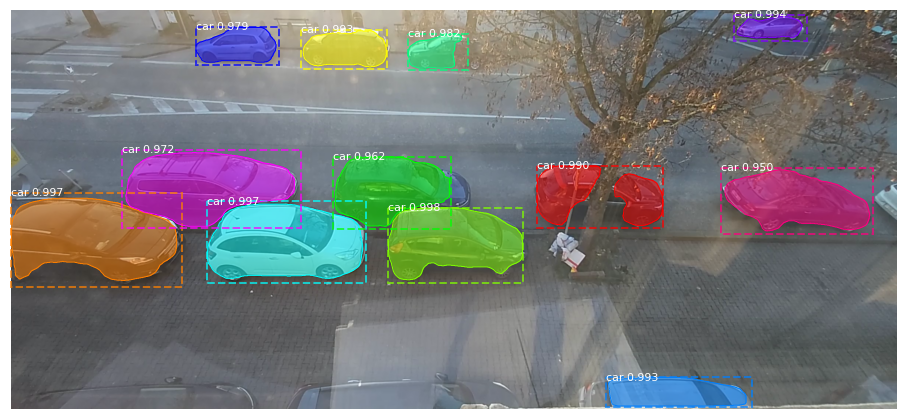

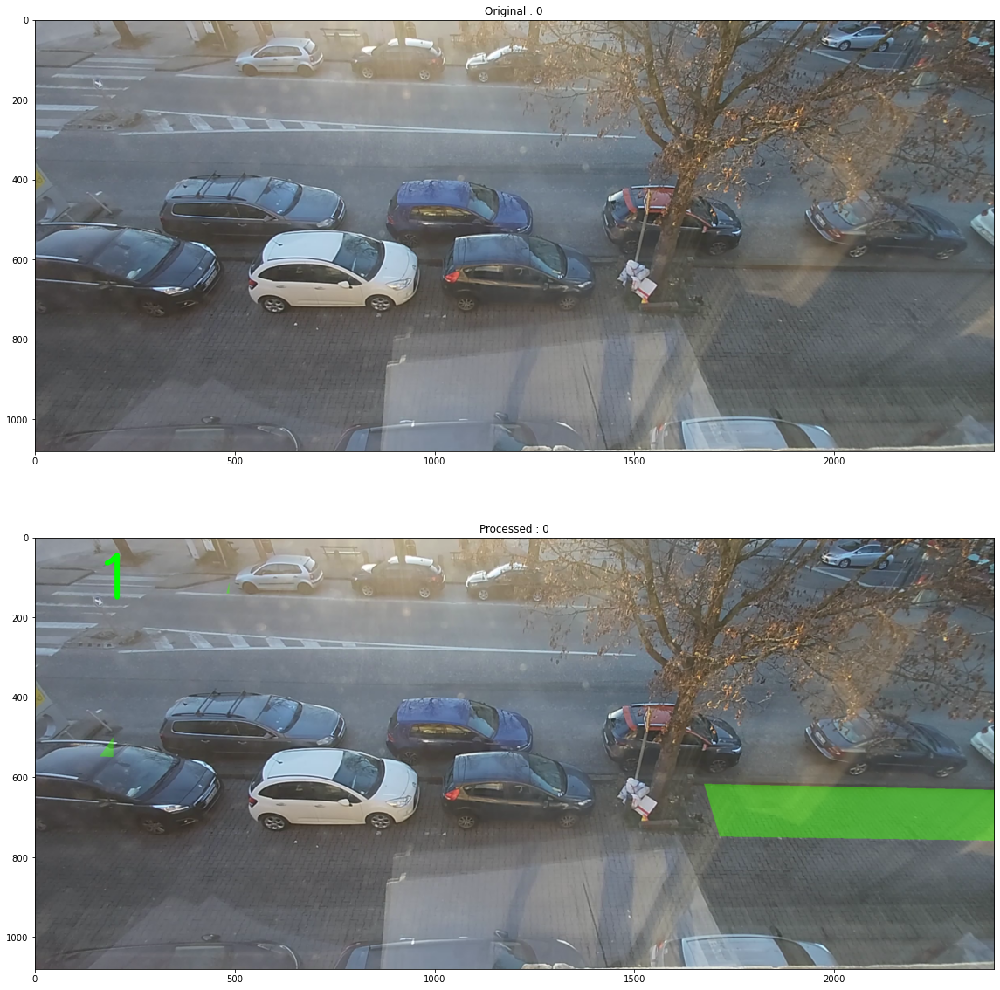

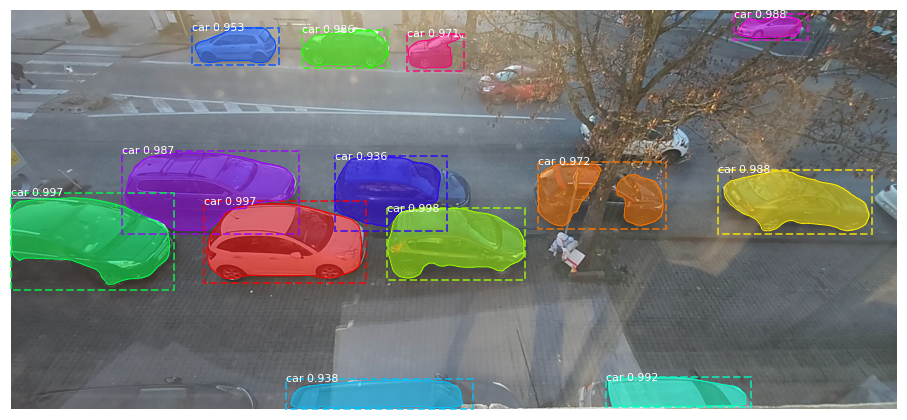

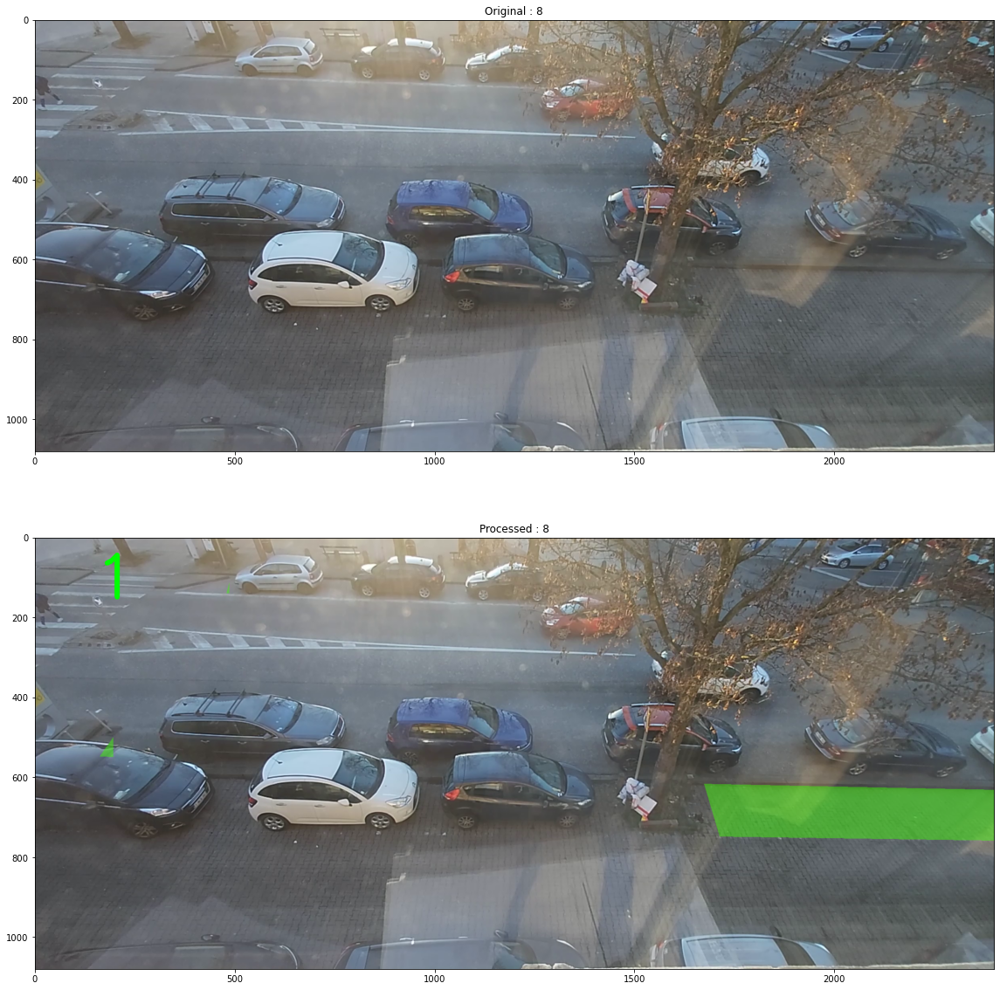

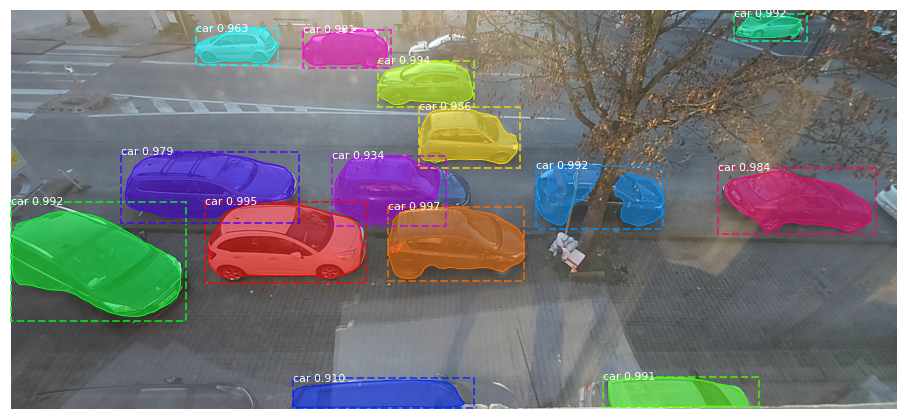

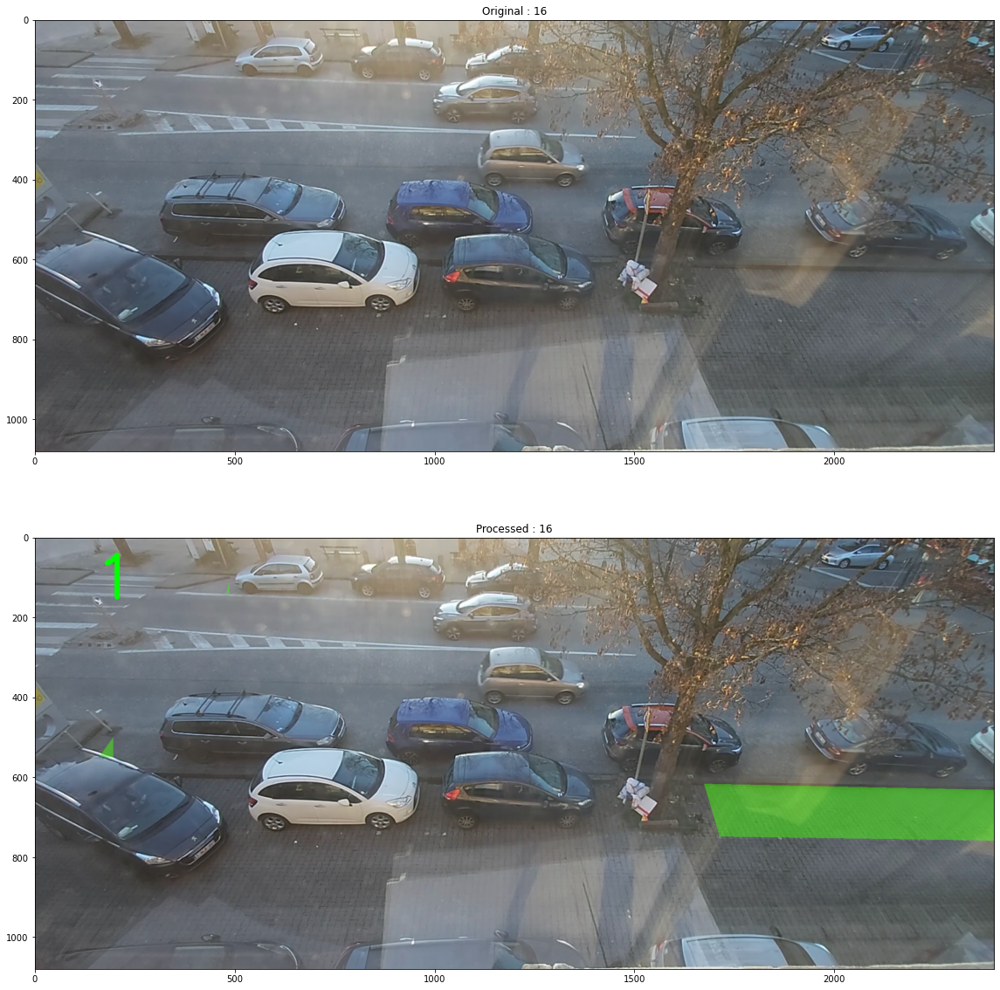

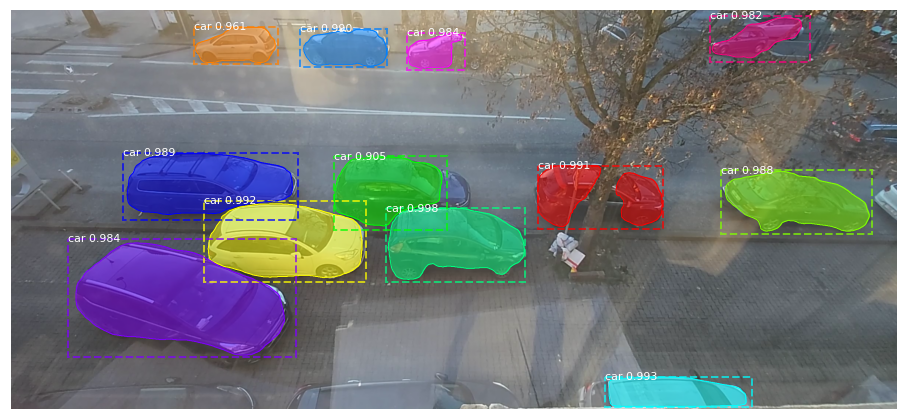

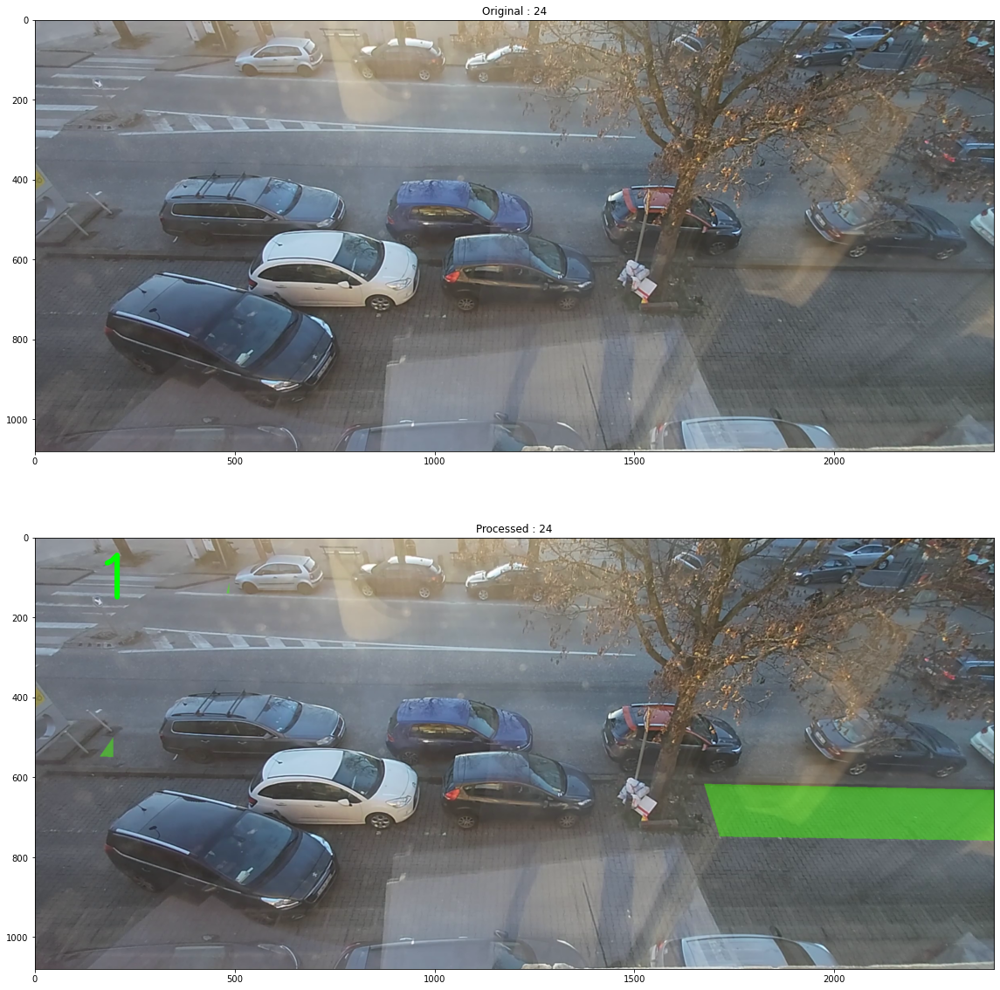

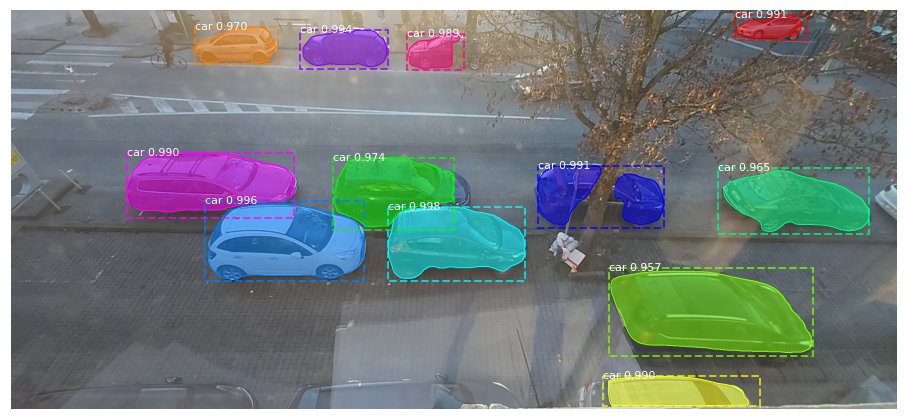

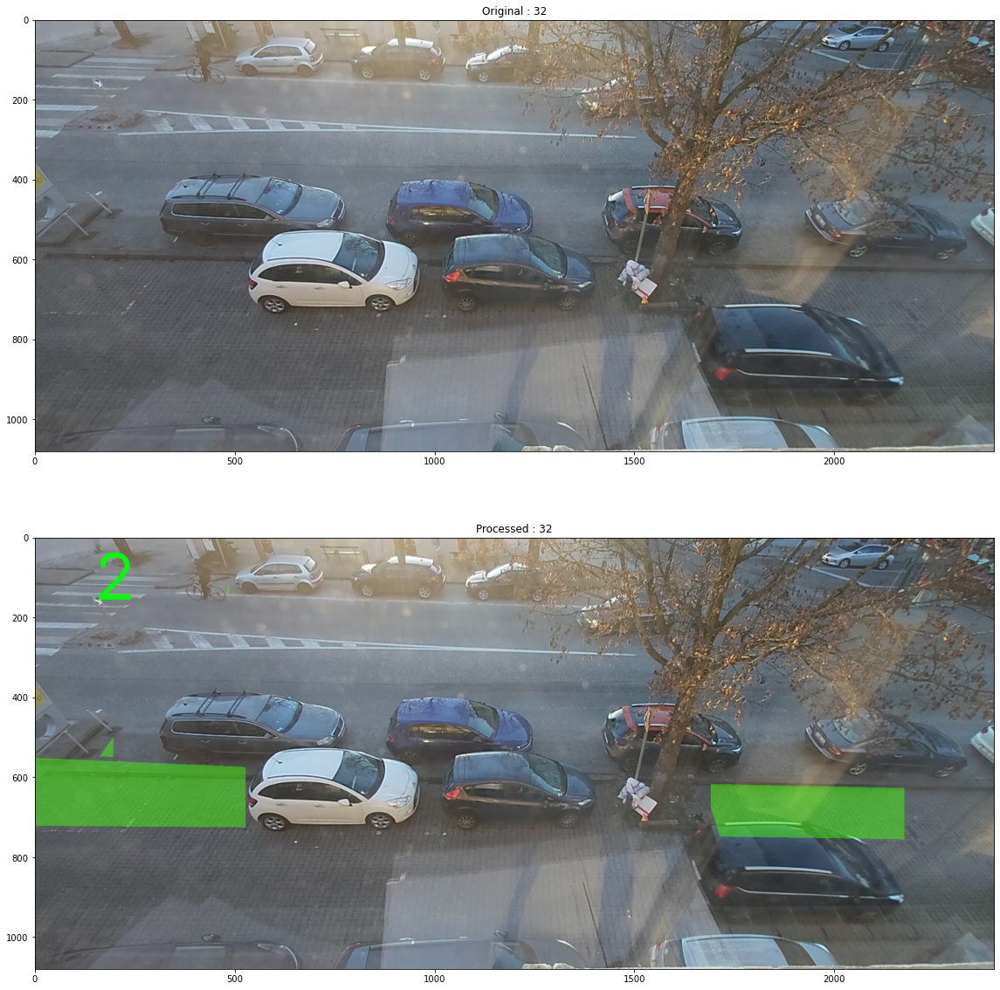

In [31]:
for i in range(0, len(frames), len(frames)//4):
    processed_image, free_spots, mask_free = process_frame(frames[i], results[i], frameConfig)
    processed_image = cv2.putText(processed_image, str(free_spots), (150,150), cv2.FONT_HERSHEY_SIMPLEX, 5, (0, 255, 0), 12)
    r = results[i]
    visualize.display_instances(frames[i], r['rois'], r['masks'], r['class_ids'], class_names, r['scores'], show_bbox=True)
    plt.figure(figsize=(20, 20))
    plt.subplot(2, 1, 1)
    plt.title("Original : " + str(i))
    plt.imshow(frames[i])
    plt.subplot(2, 1, 2)
    plt.title("Processed : " + str(i))
    plt.imshow(processed_image)
    plt.show()

## Process in live and save the video processed

In [51]:
cap = cv2.VideoCapture(Video_source)
fps = cap.get(cv2.CAP_PROP_FPS)
totalNoFrames = cap.get(cv2.CAP_PROP_FRAME_COUNT);
durationInSeconds = float(totalNoFrames) / float(fps)
frames_interval = 30 #Run model 1 frame per second
print(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
width, height = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH)), int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
print(f"image shape : ({width}, {height})")

1080.0
image shape : (2400, 1080)


In [52]:
filename = "out_" + time.strftime("%Y%m%d-%H%M%S") + ".mp4"
fps_out = 30
fourcc = cv2.VideoWriter_fourcc(*'MP4V')
out = cv2.VideoWriter(filename, fourcc, fps_out, (width, height))
counter = 0

mask_free = np.zeros_like((width, height))
free_spots = 0

while cap.isOpened():
    ret, frame = cap.read()
    if counter >= totalNoFrames:
        cap.release()
        print("Success ! Video closed.")
        break

    elif not ret :
        print("couldn't read frame")
        cap.release()
        print("Fail ! Video closed.")
        break
    
    elif counter%frames_interval == 0 :
        r = model.detect([frame], verbose=0)[0]
        frame, free_spots, mask_free = process_frame(frame, r, frameConfig)
    
    frame = apply_mask_rgb(frame, mask_free, color=[68, 245, 15])
    frame = cv2.putText(frame, str(free_spots), (150,150), cv2.FONT_HERSHEY_SIMPLEX, 5, (0, 255, 0), 12)
    
    out.write(frame)
    cv2.imshow('frame',frame)
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break
    
    counter+=1

# Release everything if job is finished
cap.release()
out.release()
cv2.destroyAllWindows()

Success ! Video closed.
